In [2]:
import process_db
import h5py
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import random
random.seed(1)

rna_embeddings = np.loadtxt('./output/sce_10xPBMC_rna_skip_referenced_random_right_path_embeddings.txt')
atac_embeddings = np.loadtxt('./output/sce_10xPBMC_atac_skip_referenced_random_right_path_embeddings.txt')
print(rna_embeddings.shape)
print(atac_embeddings.shape)
embeddings =  np.concatenate((rna_embeddings, atac_embeddings))
print(embeddings.shape)
embeddings=np.nan_to_num(embeddings)
tsne_results = TSNE(perplexity=30, n_iter = 1000).fit_transform(embeddings)
tsne_results.shape
df = pd.DataFrame()
df['tSNE1'] = tsne_results[:,0]
df['tSNE2'] = tsne_results[:,1]
print("done")


(30305, 64)
(30305, 64)
(60610, 64)


/home/jo10595/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/jo10595/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


done


In [1]:
#print(df)
rna_labels = np.loadtxt('./data/maize_leaf_harmony_integrated.v3.subLEIDEN.metadata_fixed.txt')
atac_predictions = np.loadtxt('./output/sce_10xPBMC_atac_skip_referenced_random_right_path_knn_predictions.txt')
labels =  np.concatenate((rna_labels, atac_predictions))
#print(df.shape)
#print(len(rna_labels))
#print(len(atac_predictions))
#print(len(labels))
label_to_idx = pd.read_csv('./data/label_to_idx.txt', sep = '\t', header = None)
label_to_idx.shape
label_dic = []
for i in range(label_to_idx.shape[0]):
    label_dic = np.append(label_dic, label_to_idx[0][i][:-2])

#print(label_dic)
#print(len(label_dic))
#print(labels)
#print(label_dic[labels.astype(int)[39]])

#print(labels)
#print(len(labels))
#print(label_dic[labels.astype(int)])
#print(len(label_dic[labels.astype(int)]))
#for x in labels.astype(int):
#    print(x)
#    print(label_dic[x])

data_label = np.array(["scRNA-seq", "scATAC-seq"])
df['data'] = np.repeat(data_label, [rna_embeddings.shape[0], atac_embeddings.shape[0]], axis=0)
#print(len(labels.astype(int)))
#print(df['data'])
#print(label_dic[labels.astype(int)])
#print(len(df['data']))
#print(label_dic)
#for item in labels:
#    print(item)
#    print(label_dic[item.astype(int)])
#print(labels[1])
#print(label_dic[labels[1].astype(int)])
df['predicted'] = label_dic[labels.astype(int)-1]



plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_skip_referenced_random_right_path_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_skip_referenced__right_path_1.png")

NameError: name 'np' is not defined

In [83]:
data = pd.read_csv('library.txt', sep=" ", header=None)
print(pd.unique(data[0]))

#with open("library.txt", "r") as l1:
#with open("umi.txt", "r") as l1:
#with open("S.score.txt", "r") as l1:
#with open("G2M.score.txt", "r") as l1:
    

['Xuan_maize_rna2_addseq' 'B73Mo17_maize_rna_fresh'
 'B73Mo17_maize_rna_frozen' 'Zm-leaf-scRNA-rep1']


/tmp/ipykernel_28363/1992130206.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_modi['predicted'] = data


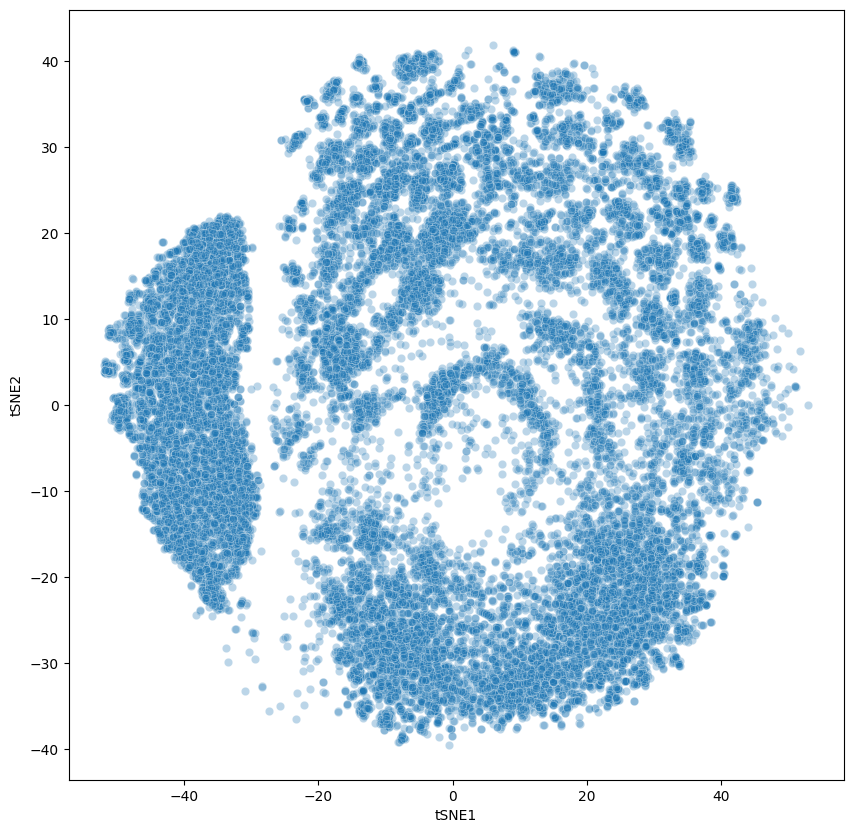

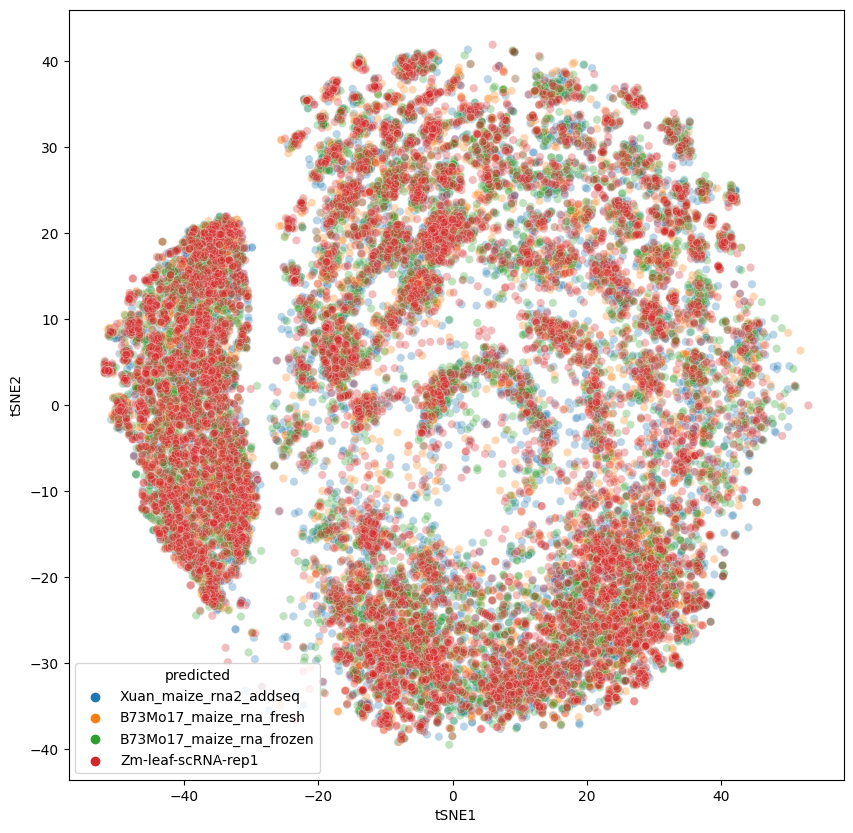

In [84]:
df_modi = df[df.data == "scRNA-seq"]
data = pd.read_csv('library.txt', sep=" ", header=None)
df_modi['predicted'] = data


#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_random_new_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random1.png")

In [89]:
#print(df_modi['predicted'].value_counts())
#print(pd.unique(df_modi['predicted']))
#print(pd.unique(df_modi['predicted'].value_counts()))
#ax = df_modi['predicted'].plot.kde()
#df_modi_count["column"]=pd.unique(df_modi['predicted'])
#df_modi_count["row"]=pd.unique(df_modi['predicted'].value_counts())
#print(df_modi_count)
#ax = df_modi['predicted'].value_counts().plot.hist(bins=4, alpha=0.5)
#ax = df_modi_count.plot.hist(column=["column"], by="row", figsize=(10, 8))
print(df_modi['predicted'].value_counts())


Xuan_maize_rna2_addseq      9858
Zm-leaf-scRNA-rep1          8668
B73Mo17_maize_rna_fresh     6134
B73Mo17_maize_rna_frozen    5645
Name: predicted, dtype: int64


In [34]:
data = pd.read_csv('umi.txt', sep=" ", header=None)
#print(pd.unique(data[0]))

import matplotlib.cm as cm
import matplotlib.colors as colors

norm = colors.Normalize(vmin=-14, vmax=86)
f2rgb = cm.ScalarMappable(norm=norm, cmap=cm.get_cmap('RdYlGn'))

def f2hex(f2rgb, f):
    rgb = f2rgb.to_rgba(f)[:3]
    return '#%02x%02x%02x' % tuple([255*fc for fc in rgb])

count=0
data[0]=data[0].astype(int)
#print(type(data[0]))
for item in data[0]:
    #print(item)
    #item=item.astype(int)
    data[0][count]=f2hex(f2rgb, item)
    count+=1
#print f2hex(f2rgb, -13.5)  #   gives #a60126  ie, dark red
#print f2hex(f2rgb, 85.5)  

<class 'pandas.core.series.Series'>


TypeError: %x format: an integer is required, not numpy.float64

In [12]:
import pandas as pd
data = pd.read_csv('umi.txt', sep=" ", header=None)
#print(pd.unique(data[0]))
#print(np.max(data[0]))
from numpy import arange

from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap


# ======
## data:
# =================
## custom colormap:

# red-green colormap:
cdict = {'red':   [(0.0, 1.0, 1.0),  # red decreases
                   (1.0, 0.0, 0.0)],

         'green': [(0.0, 0.0, 0.0),  # green increases
                   (1.0, 1.0, 1.0)],

         'blue':  [(0.0, 0.0, 0.0),  # no blue at all
                   (1.0, 0.0, 0.0)]}
red_green_cm = LinearSegmentedColormap('RedGreen', cdict, 30)

colors = cm.get_cmap(red_green_cm, data[0])

#print(colors)

#fig = plt.figure()
#ax = fig.add_subplot(111)
df_color = pd.DataFrame(columns=['color'])
# each line is of its own color:
for i, x in enumerate(data[0]):
    df_color = df_color.append({'color': colors(i)}, ignore_index=True)

print(df_color)

#pd.concat([pd.DataFrame([i], columns=['A']) for i in range(5)],

#          ignore_index=True)
#    ax.plot(data[0], data[0]*x, color=colors(i))

#fig.savefig("red-green-cm.png")

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

                                                   color
0                                   (1.0, 0.0, 0.0, 1.0)
1      (0.9655172413793104, 0.034482758620689655, 0.0...
2      (0.9310344827586207, 0.06896551724137931, 0.0,...
3      (0.896551724137931, 0.10344827586206896, 0.0, ...
4      (0.8620689655172413, 0.13793103448275862, 0.0,...
...                                                  ...
30300                               (0.0, 1.0, 0.0, 1.0)
30301                               (0.0, 1.0, 0.0, 1.0)
30302                               (0.0, 1.0, 0.0, 1.0)
30303                               (0.0, 1.0, 0.0, 1.0)
30304                               (0.0, 1.0, 0.0, 1.0)

[30305 rows x 1 columns]


/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_color = df_color.append({'color': colors(i)}, ignore_index=True)
/tmp/ipykernel_28363/3177438461.

In [9]:
print(df_color)

                                                   color
0                                   (1.0, 0.0, 0.0, 1.0)
1      (0.9655172413793104, 0.034482758620689655, 0.0...
2      (0.9310344827586207, 0.06896551724137931, 0.0,...
3      (0.896551724137931, 0.10344827586206896, 0.0, ...
4      (0.8620689655172413, 0.13793103448275862, 0.0,...
...                                                  ...
30300                               (0.0, 1.0, 0.0, 1.0)
30301                               (0.0, 1.0, 0.0, 1.0)
30302                               (0.0, 1.0, 0.0, 1.0)
30303                               (0.0, 1.0, 0.0, 1.0)
30304                               (0.0, 1.0, 0.0, 1.0)

[30305 rows x 1 columns]


In [104]:
data = pd.read_csv('umi.txt', sep=" ", header=None)
print(np.max(data[0]))
print(111032/30)

111032
3701.0666666666666


/tmp/ipykernel_28363/3262231556.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_modi['predicted'] = (data[0]/3701).astype(int)


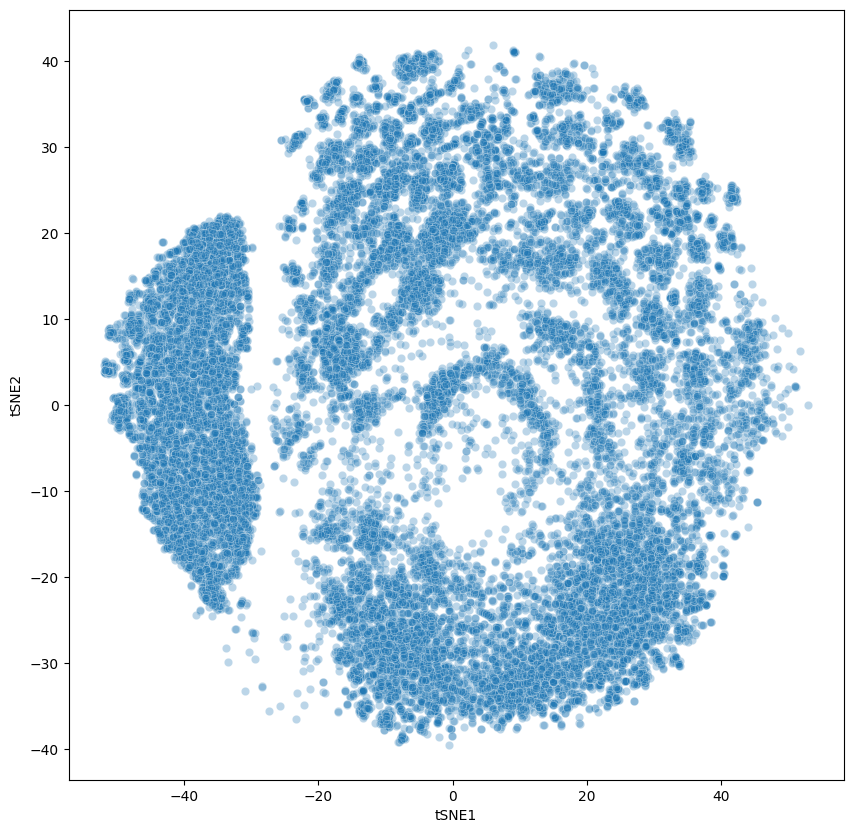

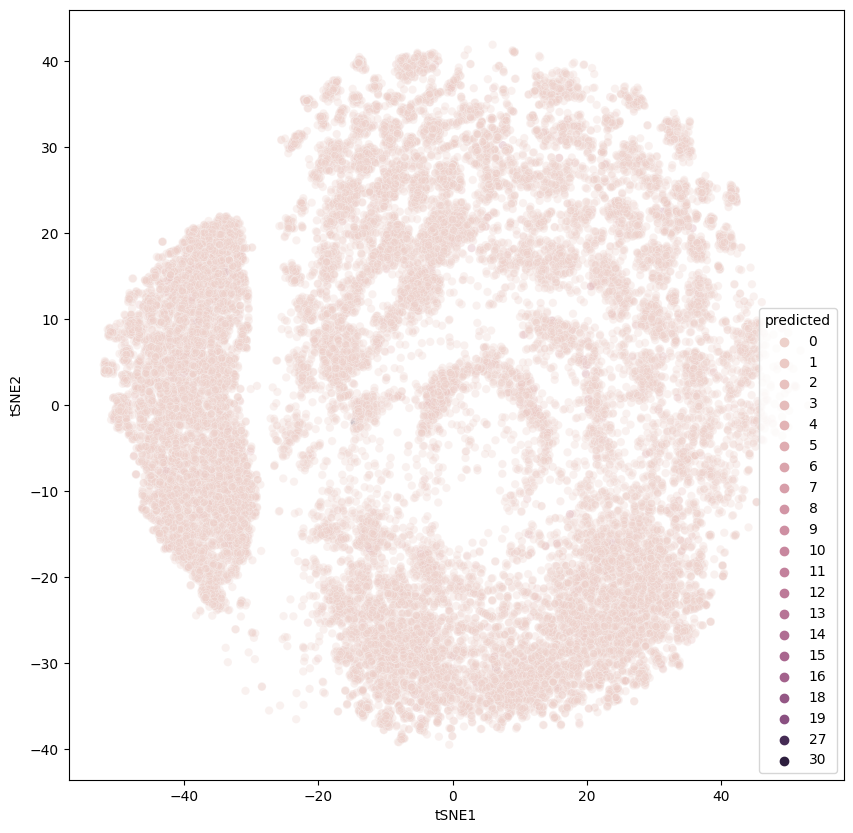

In [105]:
#data = pd.read_csv('library.txt', sep=" ", header=None)
#print(pd.unique(data[0]))

#with open("library.txt", "r") as l1:
#with open("umi.txt", "r") as l1:
#with open("S.score.txt", "r") as l1:
#with open("G2M.score.txt", "r") as l1:
df_modi = df[df.data == "scRNA-seq"]
data = pd.read_csv('umi.txt', sep=" ", header=None)
#data[0]=data[0].astype(int)
df_modi['predicted'] = (data[0]/3701).astype(int)


#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_random_new_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random1.png")

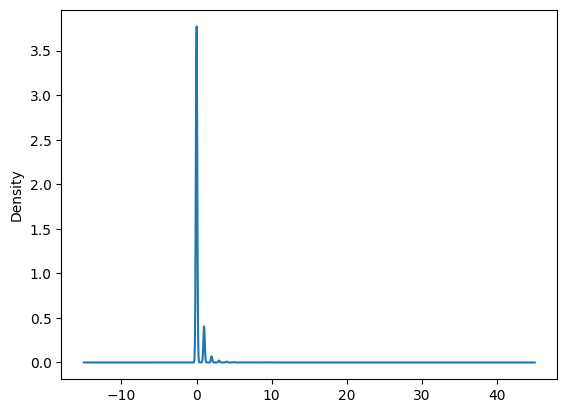

In [106]:
ax = df_modi['predicted'].plot.kde()


In [107]:
print(df_modi['predicted'].value_counts())


0     26576
1      2915
2       476
3       156
4        73
5        33
6        17
7        15
10       10
8        10
11        6
9         4
14        3
16        2
15        2
18        2
19        1
30        1
27        1
13        1
12        1
Name: predicted, dtype: int64


In [96]:
data = pd.read_csv('S.score.txt', sep=" ", header=None)
print(np.max(data[0]))
#print(111032/30)
print(1.375/30)
#print((data[0]/1.4))

1.375456
0.04583333333333333


/tmp/ipykernel_28363/562991130.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_modi['predicted'] = (data[0]/0.04583333333333333).astype(int)


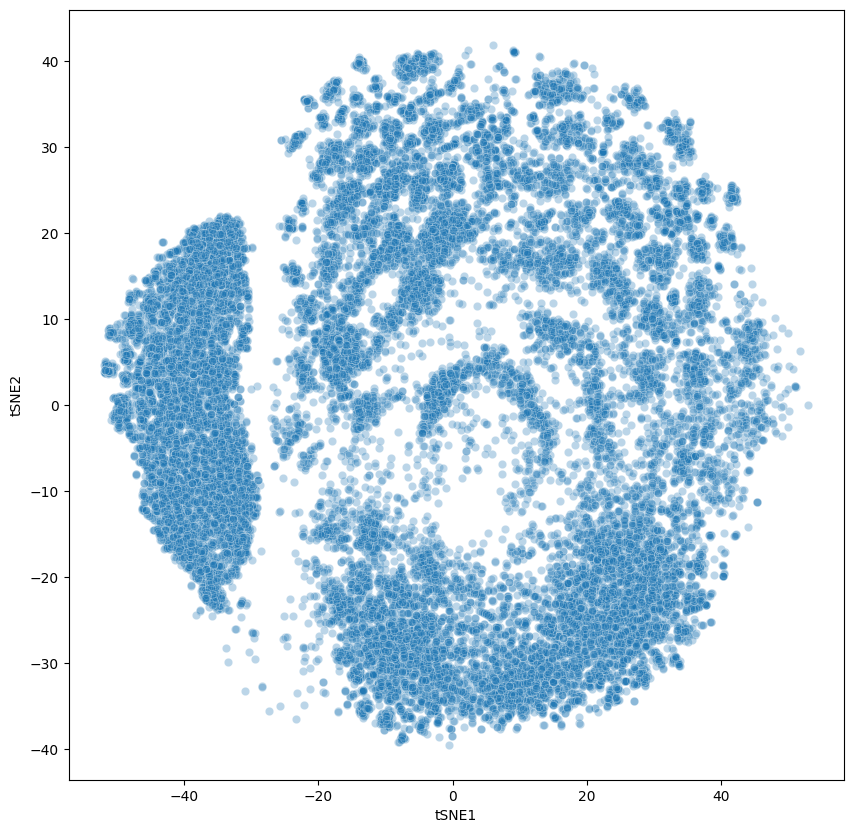

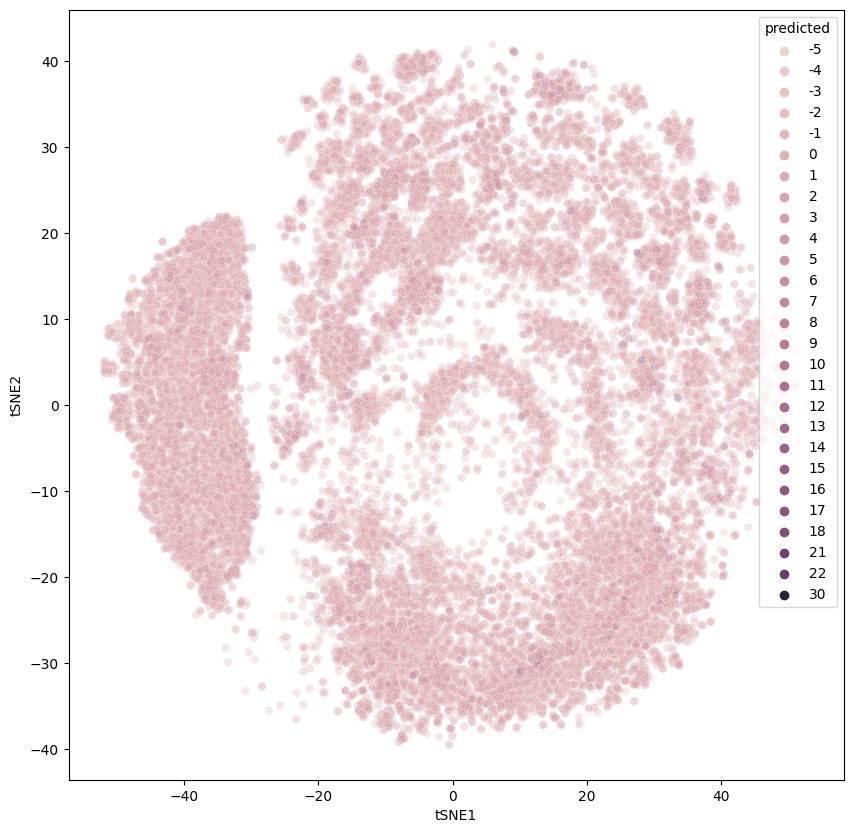

In [97]:
#data = pd.read_csv('library.txt', sep=" ", header=None)
#print(pd.unique(data[0]))

#with open("library.txt", "r") as l1:
#with open("umi.txt", "r") as l1:
#with open("S.score.txt", "r") as l1:
#with open("G2M.score.txt", "r") as l1:
df_modi = df[df.data == "scRNA-seq"]
data = pd.read_csv('S.score.txt', sep=" ", header=None)
#data[0]=data[0].astype(int)
df_modi['predicted'] = (data[0]/0.04583333333333333).astype(int)


#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_random_new_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random1.png")

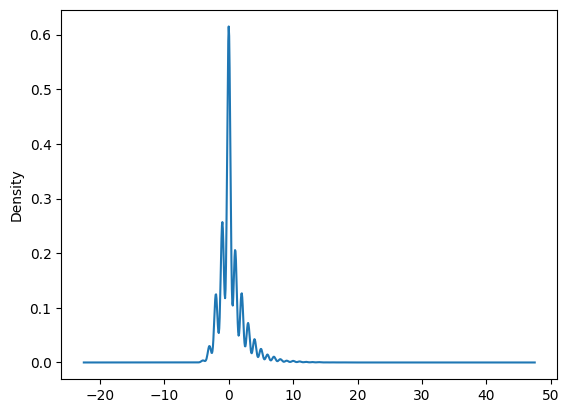

In [98]:
#print(df_modi['predicted'].value_counts())
#print(pd.unique(df_modi['predicted']))
#print(pd.unique(df_modi['predicted'].value_counts()))
ax = df_modi['predicted'].plot.kde()
#df_modi_count["column"]=pd.unique(df_modi['predicted'])
#df_modi_count["row"]=pd.unique(df_modi['predicted'].value_counts())
#print(df_modi_count)
#ax = df_modi_count.plot.hist(bins=30, alpha=0.5)
#ax = df_modi_count.plot.hist(column=["column"], by="row", figsize=(10, 8))

In [99]:
print(df_modi['predicted'].value_counts())

 0     12048
-1      5030
 1      4041
 2      2489
-2      2456
 3      1416
 4       836
-3       590
 5       488
 6       285
 7       207
 8       118
-4        73
 9        64
 10       57
 11       37
 12       22
 13       15
 14       12
 16        4
 15        4
 21        3
-5         3
 17        3
 18        2
 30        1
 22        1
Name: predicted, dtype: int64


In [100]:
data = pd.read_csv('G2M.score.txt', sep=" ", header=None)
print(np.max(data[0]))
#print(111032/30)
print(0.7686157/30)
#print((data[0]/1.4))

0.7686157
0.025620523333333332


/tmp/ipykernel_28363/3927226742.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_modi['predicted'] = (data[0]/0.025620523333333332).astype(int)


0        2
1       -1
2        0
3       -4
4        2
        ..
30300   -1
30301    0
30302   -2
30303   -1
30304    0
Name: predicted, Length: 30305, dtype: int64


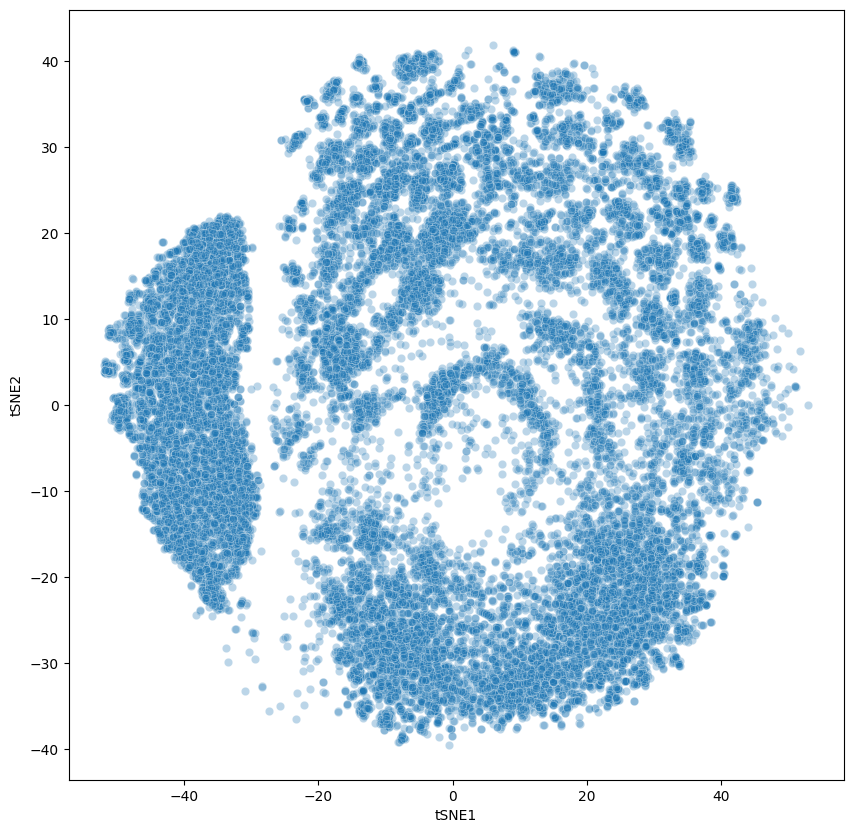

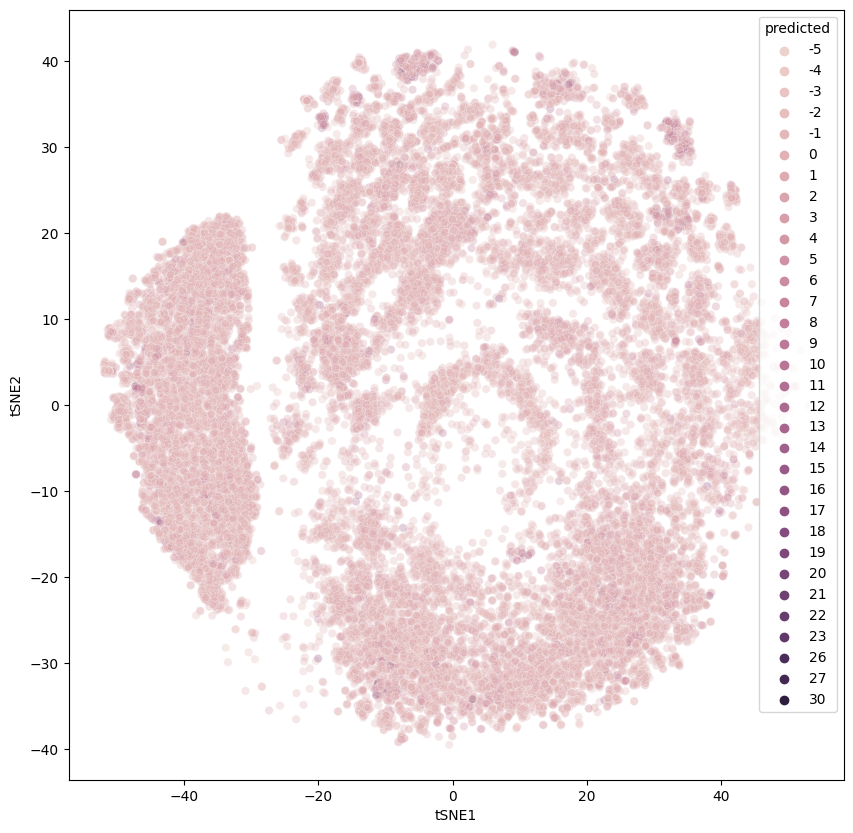

In [101]:
#data = pd.read_csv('library.txt', sep=" ", header=None)
#print(pd.unique(data[0]))

#with open("library.txt", "r") as l1:
#with open("umi.txt", "r") as l1:
#with open("S.score.txt", "r") as l1:
#with open("G2M.score.txt", "r") as l1:
df_modi = df[df.data == "scRNA-seq"]
data = pd.read_csv('G2M.score.txt', sep=" ", header=None)
#data[0]=data[0].astype(int)
df_modi['predicted'] = (data[0]/0.025620523333333332).astype(int)

print(df_modi['predicted'])

#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_random_new_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random1.png")

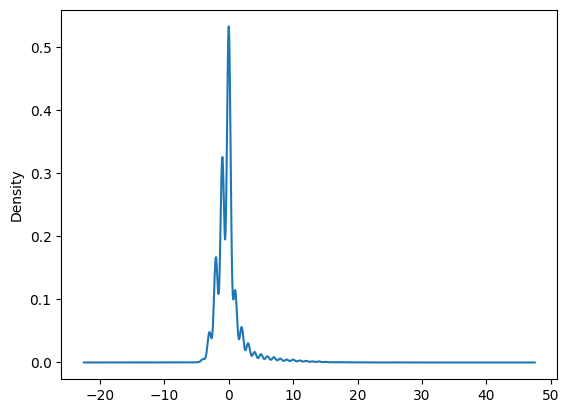

In [102]:
ax = df_modi['predicted'].plot.kde()


In [103]:
#import matplotlib.pyplot as plt

#pd.unique(df_modi['predicted'])
print(df_modi['predicted'].value_counts())
#counts = df_modi['predicted'].nunique(axis=0)
#print(counts)
#print(df_modi.nunique(axis=1))

 0     11937
-1      7267
-2      3737
 1      2533
 2      1253
-3      1070
 3       682
 4       370
 5       292
 6       220
 7       185
 8       138
-4       117
 9       103
 10      102
 11       72
 12       58
 13       40
 14       37
 15       22
 16       13
 17       13
 18       11
-5         7
 19        7
 20        5
 21        4
 26        3
 22        3
 23        2
 27        1
 30        1
Name: predicted, dtype: int64


/tmp/ipykernel_28363/3351042349.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_modi['predicted'] = df_color


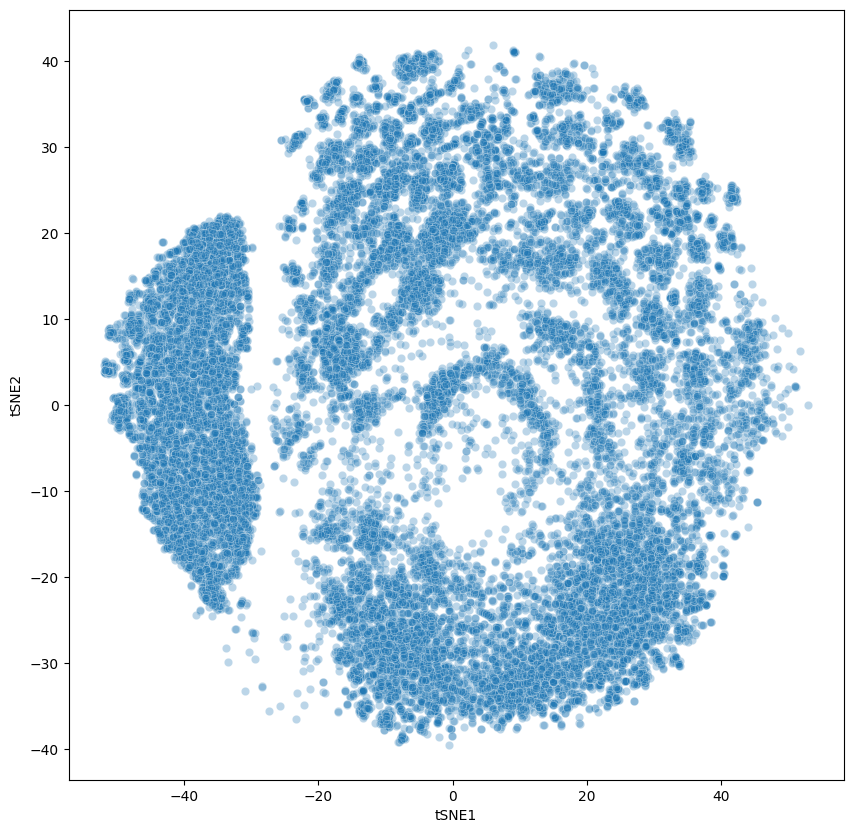

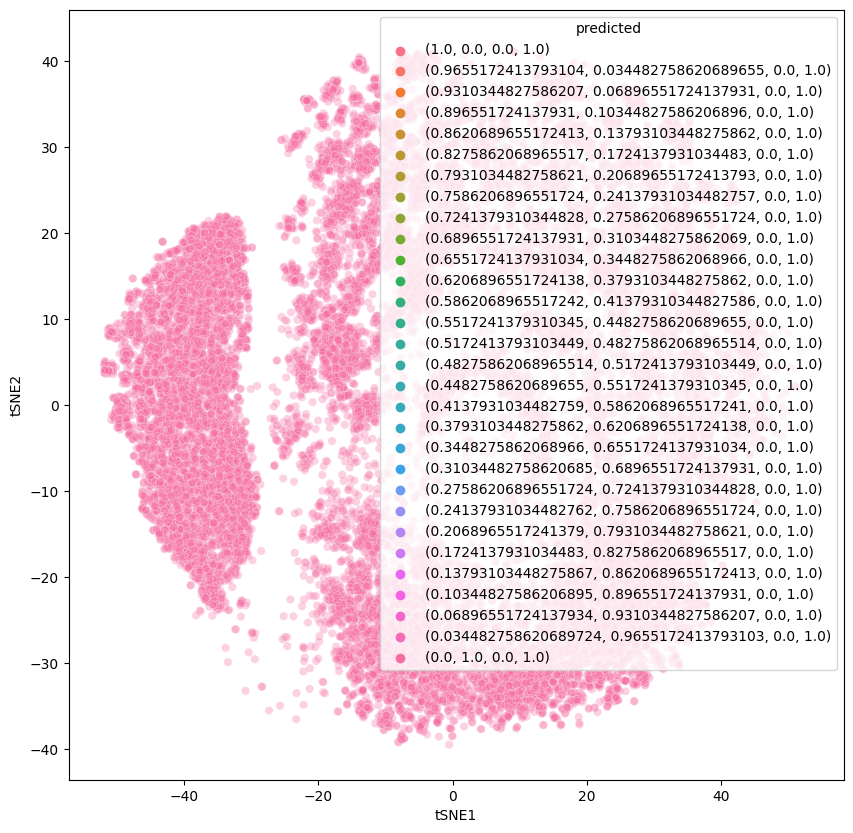

In [20]:
#data = pd.read_csv('library.txt', sep=" ", header=None)
#print(pd.unique(data[0]))

#with open("library.txt", "r") as l1:
#with open("umi.txt", "r") as l1:
#with open("S.score.txt", "r") as l1:
#with open("G2M.score.txt", "r") as l1:
df_modi = df[df.data == "scRNA-seq"]
data = pd.read_csv('S.score.txt', sep=" ", header=None)
df_modi['predicted'] = df_color


#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_random_new_1.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random1.png")

In [22]:
print(df_color.color!=(1.0, 0.0, 0.0, 1.0))

0        False
1         True
2         True
3         True
4         True
         ...  
30300     True
30301     True
30302     True
30303     True
30304     True
Name: color, Length: 30305, dtype: bool


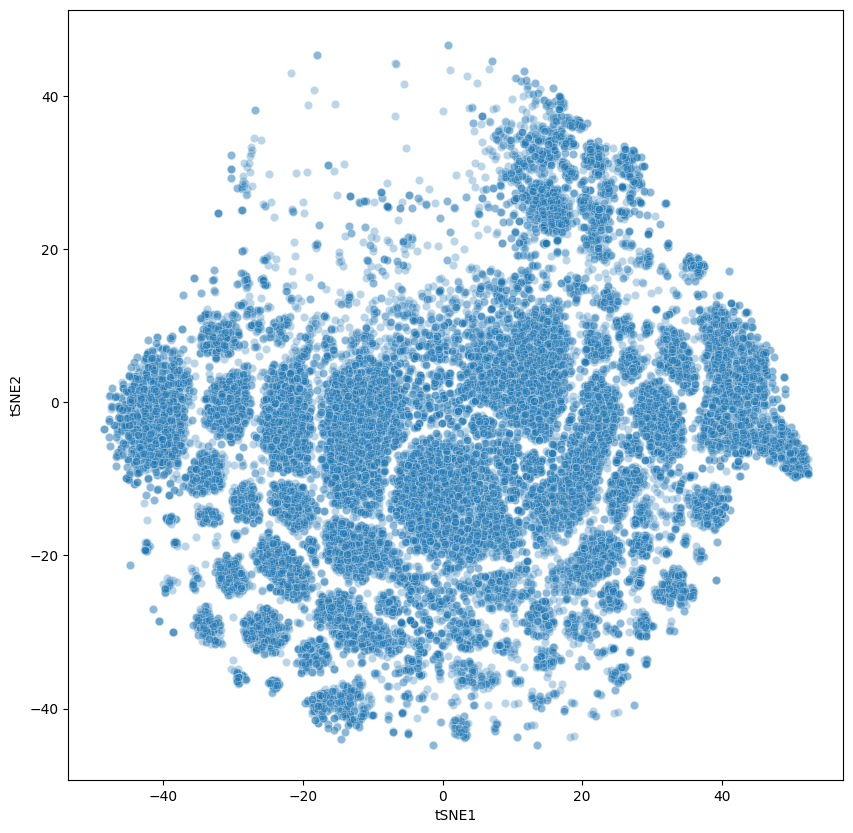

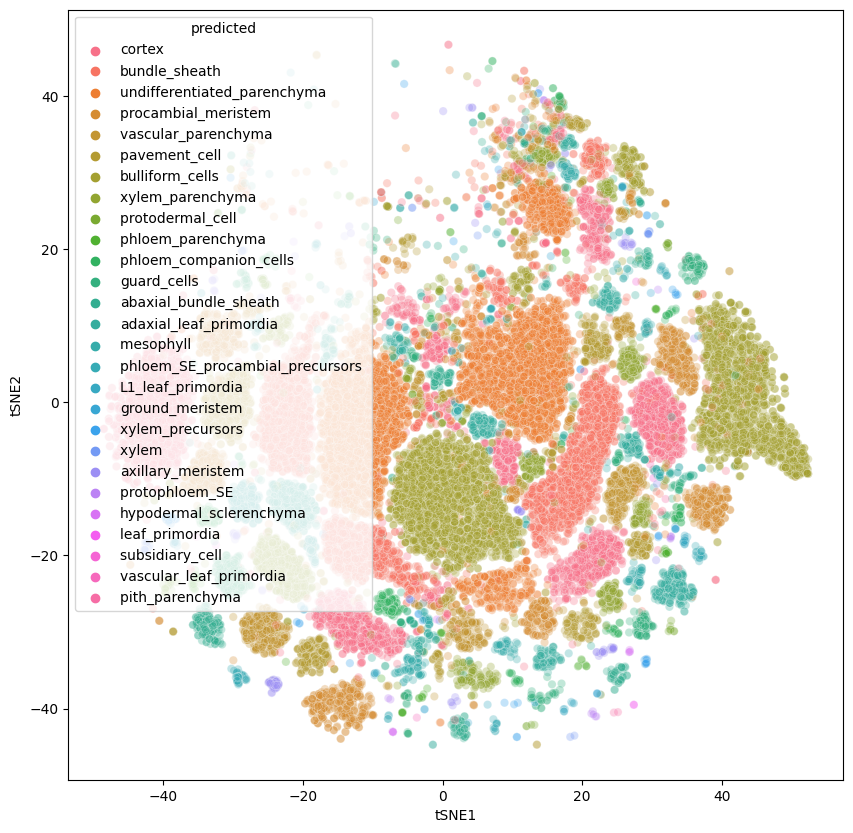

In [25]:
df_modi = df[df.data == "scATAC-seq"]

#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_new_random2.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_new_random2.png")